# Analisi di Wikipedia
## Descrizione del Progetto
Wikidata Insights, un'azienda leader nella gestione di contenuti digitali, è stata incaricata da Wikimedia per ottimizzare l'analisi e la categorizzazione dei contenuti di Wikipedia. Per supportare la loro continua espansione e migliorare l'organizzazione delle informazioni, Wikidata Insights ha deciso di condurre un progetto avanzato di data analysis e machine learning. L'obiettivo principale è comprendere meglio il vasto patrimonio di contenuti informativi offerti da Wikipedia e sviluppare un sistema di classificazione automatica che consenta di categorizzare efficacemente i nuovi articoli futuri.

## Obiettivi
### 1. Analisi Descrittiva dei Contenuti
Il primo obiettivo del progetto è condurre un'analisi esplorativa dei dati (EDA) per capire le caratteristiche dei contenuti di Wikipedia suddivisi in diverse categorie tematiche, come ad esempio: - Cultura, Economia, Medicina, Tecnologia, Politica, Scienza, e altre.

L'analisi esplorativa prevede:
- il conteggio degli articoli presenti per ogni categoria;
- il numero medio di parole per articolo;
- la lunghezza dell'articolo più lungo e di quello più corto per ciascuna categoria;
- la creazione di nuvole di parole rappresentative per ogni categoria, per identificare i termini più frequenti e rilevanti.

### 2. Sviluppo di un Classificatore Automatico
Il secondo obiettivo è creare un modello di machine learning capace di classificare automaticamente gli articoli in base alla loro categoria. Il sistema di classificazione verrà addestrato utilizzando dati di testo presenti nelle seguenti colonne del dataset:

- Sommario (summary): introduzione breve dell'articolo.
- Testo Completo (documents): contenuto completo dell'articolo.

### 3. Identificazione di Nuovi Insights
L'analisi consentirà anche di ottenere preziosi insights sui contenuti di Wikipedia, come la densità di articoli per categoria o le tendenze linguistiche associate a determinati argomenti. Queste informazioni possono aiutare Wikimedia a migliorare l'organizzazione delle pagine e a ottimizzare i propri sforzi editoriali.

## Import del dataset
In questa prima sezione importiamo il dataset appoggiandoci ad un dataframe Pandas. Questa non è una procedura comune ma in questo caso ci permette di leggere correttamente (superando con poco sforzo il limite dei separator) i dati con cui definire un DataFrame Spark e una Table 'Wikipedia'.

In [ ]:
#NB: 1) %pip install wget ---> istallazione necessaria se il package wget non è presente";
#    2) E' possibile che questo step vada in errore se la tabella esiste già

import wget
import pandas as pd

#Download del file e creazione del DataFrame
wget.download('https://proai-datasets.s3.eu-west-3.amazonaws.com/wikipedia.csv', '/tmp/wikipedia.csv')
dataset = pd.read_csv('/tmp/wikipedia.csv')
spark_df = spark.createDataFrame(dataset)
spark_df = spark_df.drop("Unnamed: 0")
spark_df.write.saveAsTable("wikipedia")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-6028342024711923>, line 12
     10 spark_df = spark.createDataFrame(dataset)
     11 spark_df = spark_df.drop("Unnamed: 0")
---> 12 spark_df.write.saveAsTable("wikipedia")

File /databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/readwriter.py:713, in DataFrameWriter.saveAsTable(self, name, format, mode, partitionBy, **options)
    711 self._write.table_name = name
    712 self._write.table_save_method = "save_as_table"
--> 713 _, _, ei = self._spark.client.execute_command(
    714     self._write.command(self._spark.client), self._write.observations
    715 )
    716 self._callback(ei)

File /databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/client/core.py:1481, in SparkConnectClient.execute_command(self, command, observations, extra_request_metadata)
   1479     req.user_context.user_id =

## EDA (Explorative Data Analysis)
Il primo obiettivo del progetto è condurre un'analisi esplorativa dei dati (EDA) per capire le caratteristiche dei contenuti di Wikipedia suddivisi in diverse categorie tematiche, come ad esempio: - Cultura, Economia, Medicina, Tecnologia, Politica, Scienza, e altre. L'analisi esplorativa prevede:

- il conteggio degli articoli presenti per ogni categoria;
- il numero medio di parole per articolo;
- la lunghezza dell'articolo più lungo e di quello più corto per ciascuna categoria;
- la creazione di nuvole di parole rappresentative per ogni categoria, per identificare i termini più frequenti e rilevanti.

In questa fase combineremo sia linguaggio SQL che Python.


In [ ]:
    %sql
    -- Una prima descrizione della tipologia di colonne contenute nel dataset
    DESCRIBE wikipedia;

col_name,data_type,comment
title,string,null
summary,string,null
documents,string,null
categoria,string,null


Notiamo che il dataset è composto da quattro colonne tutte di tipo stringa: title summary, documents e categoria.

In [ ]:
%sql
-- Conteggio delle righe totali del dataset
SELECT COUNT(*) AS n_rows FROM wikipedia;

n_rows
153232


Il dataset contiene 153232 righe. Cerchiamo ora di avere una visione più chiara sul contenuto del dataset.

In [ ]:
%sql
-- Esempio di record contenuto nel dataset (in questo caso selezioniamo la prima riga del dataset)
SELECT * FROM wikipedia LIMIT 1;

title,summary,documents,categoria
marek reichman,marek paul reichman (born 1966) is a british industrial designer. he serves as chief creative officer and studio head at aston martin.,"marek paul reichman (born 1966) is a british industrial designer. he serves as chief creative officer and studio head at aston martin. early life reichman was born in sheffield in the west riding of yorkshire to an english mother and polish father. his father's job as a blacksmith and his family's love for cars influenced his interest in industrial design. he graduated from teesside university in middlesbrough with a 1st class honours degree in industrial design, then studied vehicle design at the royal college of art in london as the first land rover student. about his early life he stated: ""my father worked as a blacksmith, which is why i grew up with knowledge of making things. it’s where i picked up my artistic skills, and realised that design surrounds us, whether it’s through a traditional method of designing or through a craft. design is integral to the human race. my father is polish, and my mother is english. i grew up in a family with many car fanatics. i wanted to be an industrial designer, to learn the science behind materials, so i studied industrial design to get the knowledge base."" career he started his career in 1991 with rover cars. in 1995, after rover's takeover by bmw, he moved to bmw designworks in california, eventually becoming senior designer and leading the design direction of land rover, most significantly the 2003 range rover (l322). in may 2005, he became director of design for aston martin.in 2008, by invitation, he became an assistant professor at the royal college of art. portfolio his projects include the aston martin one-77, the dbs, the rapide, the 2012 aston martin vanquish, the aston martin vulcan, the rolls-royce phantom vii, the lincoln mkx concept and navicross concept cars.in june 2014, the aston martin dp-100 was unveiled, which is a concept car designed for the video game gran turismo 6.in 2015 reichman directed the design of the aston martin db10 concept car, used in the james bond film spectre. also that year, reichman hired artist the kaves to do a unique paint job on their new aston martin vanquish the ""vanquish volante"". according to kaves he “wanted to have an art car, something tattoo-inspired, so he came to me."" the car was meant to be auctioned at ""the art basel"" but reported to have beed sold prior to the event. recognition reichman was awarded an honorary doctorate by teesside university in 2011. == references ==",engineering


Da questo esempio, possiamo notare il contenuto di ognuna delle quattro colonne:

- title: titolo dell'articolo;
- summary: breve riassunto dell'articolo;
- documents: il contenuto vero e proprio dell'articolo;
- categoria: l'argomento dell'articolo (nel nostro caso l'articolo tratta di un personaggio legato al mondo dell'ingegneria).

In [ ]:
%sql
-- Conteggio degli articoli presenti per ogni categoria
SELECT categoria,
       COUNT(DISTINCT documents) AS n_art_by_categ
    FROM wikipedia
    GROUP BY categoria
    ORDER BY n_art_by_categ DESC;

categoria,n_art_by_categ
medicine,8281
transport,7904
research,7571
technology,6669
engineering,6087
humanities,5794
finance,5328
pets,4610
energy,4552
economics,4259


Possiamo dunque notare come la categoria maggiormente presente sia quella legata agli articoli medici. Quella meno presente riguarda invece tematiche politiche. Vediamo ora di estrarre qualche statistica utile ai fini descrittivi del progetto.

In [ ]:
 %sql
 -- Calcolo del numero medio di parole per articolo, della lunghezza dell'articolo più lungo e di quello più corto per ciascuna categoria
SELECT categoria,
       AVG(size(split(documents, ' '))) AS avg_words_per_article,
       MAX(size(split(documents, ' '))) AS max_doc,
       MIN(size(split(documents, ' '))) AS min_doc
FROM wikipedia
GROUP BY categoria;

categoria,avg_words_per_article,max_doc,min_doc
energy,587.4513106747733,23223,9
humanities,1059.7318109924872,23198,7
finance,1909.892426239481,33479,3
economics,984.2049455984175,24022,10
politics,1515.6516992428244,20140,11
science,1875.616171552233,29419,15
sports,602.1093781045103,19227,14
culture,653.8663712456918,15538,11
trade,641.1518282988872,19275,16
pets,423.1049321086262,13222,12


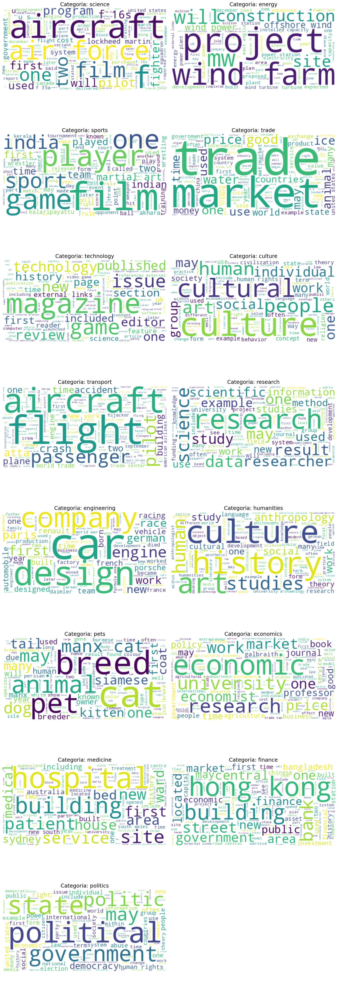

In [ ]:
# Qualora wordcloud non fosse istallata usare il comando seguente: %pip install wordcloud matplotlib
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
import pyspark.sql.functions as F

wikipedia = spark.table("wikipedia")

# Raggruppa i documenti per categoria
pdf = (
    wikipedia.groupBy("categoria")
    .agg(F.collect_list("documents").alias("documents"))
    .toPandas()
)

# Numero di categorie
n_cats = len(pdf)
n_cols = 2
n_rows = (n_cats + 1) // n_cols  # arrotonda per eccesso

# Crea la figura
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))
axes = axes.flatten()

for i, row in pdf.iterrows():
    cat = row["categoria"]
    texts = [t for t in row["documents"] if t is not None]

    if not texts:  # se non ci sono testi, salta
        continue

    all_text = " ".join(texts)[:1_000_000]

    wordcloud = WordCloud(
        width=400,
        height=200,
        background_color="white",
        stopwords=STOPWORDS
    ).generate(all_text)

    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Categoria: {cat}", fontsize=18)

# Se ci sono più assi che categorie, li spengo
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


Le nuvole di parole ci consentono di osservare visivamente come, per ogni categoria, ci siano parole più significative. Ad esempio, per la categoria "transports" vediamo emergere temi legati al volo ("flight", "aircraft", "pilot" e così via). Negli step successivi vediamo invece di capire se esiste qualche record che presenta valori a missing. Questa prima analisi consentirà di avere un primo quadro sulla gestione dei missing in fase di creazione del modello di classificazione.

In [ ]:
%sql
-- Check di eventuali righe che contengono almeno un campo a missing
SELECT *
FROM wikipedia
WHERE title IS NULL OR summary IS NULL OR documents IS NULL OR categoria IS NULL;

title,summary,documents,categoria
file:hollywood from escalator.jpg,null,null,finance
file:areva1.jpg,null,null,finance
file:tour-total.jpg,null,null,finance
file:tourariane.jpg,null,null,finance
file:tourcoeurdefense.jpg,null,null,finance
file:touregee.jpg,null,null,finance
file:tourgan.jpg,null,null,finance
file:tourssocietegenerale.jpg,null,null,finance
file:dreamworks animation skg logo with fishing boy.svg,null,null,finance
file:dreamworks animation television logo.svg,null,null,finance


In [ ]:
%sql
-- Check di eventuali valori in "categoria" (variabile target) a missing
SELECT *
FROM wikipedia
WHERE categoria IS NULL;

title,summary,documents,categoria


Questi primi controlli mostrano la presenza di record con summary e documents vuoti. Nella fase successiva di creazione del modello, vedremo di affrontare questo problemo applicando alcune funzionalità di Python. Per quanto riguarda la variabile target ("categoria") non notiamo la presenza di valori a missing.

## Modello di classificazione
In questa seconda sezione vediamo di creare un modello di classificazione per riconoscere l'argomento di un determinato articolo. Nel nostro approccio adotteremo un modello logistico; iniziamo qui di seguito a importare la libreria pandas e altri strumenti utili da sklearn.

In [ ]:
#Import delle library necessarie
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from pyspark.sql import functions as F #Libreria utile per integrare funzioni python in pyspark

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0xff17b6c5c360>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'split'


Importate le librerie necessarie di machine learning, riprendiamo di seguito lo studio dei valori a missing e di come gestirli.

In [ ]:
#Conteggio dei missing per ciascuna colonna
missing_counts = spark_df.select([
    F.count(F.when(F.col(c).isNull() | (F.col(c) == ""), c)).alias(c)
    for c in spark_df.columns
])
missing_counts.show()

+-----+-------+---------+---------+
|title|summary|documents|categoria|
+-----+-------+---------+---------+
|    0|    928|      928|        0|
+-----+-------+---------+---------+



Notiamo dunque che le righe con valorizzazioni a missing sono nettamente inferiori all'1% del totale del dataset. Optiamo a eliminare tali righe dal dataset.

In [ ]:
#Eliminazione delle righe che hanno missing in summary o documents o categoria
spark_df = spark_df.filter(
    (F.col("summary").isNotNull()) & (F.col("summary") != "") &
    (F.col("documents").isNotNull()) & (F.col("documents") != "") &
    (F.col("categoria").isNotNull()) & (F.col("categoria") != "")
)

In [ ]:
#Creazione del campo text: unione dei campi summary e documents in un unico testo
spark_df = spark_df.withColumn("text", F.concat_ws(" ", F.coalesce(spark_df["summary"], F.lit("")), F.coalesce(spark_df["documents"], F.lit(""))))

#Features (X) e Target (y)
X = spark_df["text"]
y = spark_df["categoria"]

In [ ]:
# Selezioniam le colonne e convertiamole in un Pandas DataFrame
X_pd = spark_df.select("text").toPandas()["text"]
y_pd = spark_df.select("categoria").toPandas()["categoria"]

#Train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X_pd,
    y_pd,
    test_size = 0.2,#Il training set corrisponde all'80% del dataset
    random_state = 42,#Random state fissato
    stratify = y_pd#Uso della stratify per meglio bilanciare la distribuzione delle classi
)

In [ ]:
#Check dimensioni train e test set
print(f"X_train: {X_train.shape[0]}")
print(f"X_test: {X_test.shape[0]}")

X_train: 121843
X_test: 30461


Notiamo che le numeriche sono corrette: la somma tra il numero di righe del train set con il test set coincide con 152304, ovvero le righe originali del dataset (che ricordiamo essere 153232) a cui abbiamo tolto i record a missing (che ammontavano a 928 righe).

Per la creazione del modello di classificazione, è necessario che i testi del csv vengano convertiti in "numeri", in modo da poter essere input interpretabili. Per fare ciò, utilizzeremo la TfidfVectorizer di Python; questo pacchetto consente di creare una rappresentazione numerica di un insieme di documenti (testi) in modo da capire come sia importante ogni parola o combinazione di parole (n-grammi) in quel testo rispetto a tutto il corpus. Alcuni dei parametri principali:

- max_features=20000: usa al massimo 20.000 termini nel vocabolario (per non esplodere di memoria);
- ngram_range=(1, 2): considera sia singole parole (unigrammi) sia coppie di parole consecutive (bigrammi), tipo "machine" e "machine learning";
- stop_words='english': rimuove parole molto comuni in inglese ("the", "is", "and", ...).

In [ ]:
#TF-IDF (Term Frequency – Inverse Document Frequency)
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(
    max_features=20000,#Numero di parole da tenere nel vocabolario
    ngram_range=(1, 2),#Unigrammi e bigrammi
    stop_words='english'#Eliminazione delle stopword (a lingua inglese come i dati nel csv)
)

In [ ]:
#Fit_transform e creazioni delle matrici [n_doc x n_features]
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

NB: alcune considerazioni sui comandi precedenti

- fit: il vettorizzatore legge tutti i testi di X_train e costruisce il suo vocabolario (le parole o n-grammi che terrà in memoria, max 20.000 nel nostro caso);
- transform: trasforma i testi di X_train in una matrice sparsa di dimensioni (n_documenti, n_features), dove ogni cella contiene il peso TF-IDF di quel termine nel documento; pertanto X_train_tfidf è la rappresentazione numerica dei testi di training;
- transform(X_test): qui il vocabolario è già stato fissato sul training set; trasforma i testi di test usando solo le stesse feature trovate in X_train; se nei testi di test ci sono parole nuove non viste prima, vengono ignorate.

Risultato: X_test_tfidf è la matrice sparsa dei testi di test, con lo stesso numero di colonne di X_train_tfidf.

In [ ]:
#Modello di regressione logistica
model = LogisticRegression(max_iter = 200,#Numero massimo di iterazioni per convergere
                           C = 5,#Peso della regolarizzazione
                           class_weight = "balanced"#classi bilanciate
                           )

#Fitting del modello sui dati di training
model.fit(X_train_tfidf, y_train)

LogisticRegression(C=5, class_weight='balanced', max_iter=200)

In [ ]:
#Predizione
y_pred = model.predict(X_test_tfidf)

#Probabilità previste (per ogni classe)
y_proba = model.predict_proba(X_test_tfidf)

results = pd.DataFrame({
    "text": X_test,
    "true_label": y_test,
    "predicted_label": y_pred,
    "predicted_proba": y_proba.max(axis=1)#Prende la probabilità della classe predetta
})

display(results)#Su Databricks la display mostra la tabella

text true_label predicted_label predicted_proba andrew michael spence (born november 7, 1943) is a canadian-american economist and nobel laureate.spence is the william r. berkley professor in economics and business at the stern school of business at new york university, and the philip h. knight professor of management, emeritus, and dean, emeritus, at the stanford graduate school of business.together with george a. akerlof and joseph e. stiglitz, spence is a co-recipient of the 2001 nobel memorial prize in economic sciences, "for their analyses of markets with asymmetric information." andrew michael spence (born november 7, 1943) is a canadian-american economist and nobel laureate.spence is the william r. berkley professor in economics and business at the stern school of business at new york university, and the philip h. knight professor of management, emeritus, and dean, emeritus, at the stanford graduate school of business.together with george a. akerlof and joseph e. stiglitz, spence is a co-recipient of the 2001 nobel memorial prize in economic sciences, "for their analyses of markets with asymmetric information." career spence is noted for his job-market signaling model, which inspired research into this branch of contract theory. in this model, employees signal their respective skills to employers by acquiring a certain degree of education, which is costly to them. employers will pay higher wages to more educated employees, because they know that the proportion of employees with high abilities is higher among the educated ones, as it is less costly for them to acquire education than it is for employees with low abilities. for the model to work, it is not even necessary for education to have any intrinsic value if it can convey information about the sender (employee) to the recipient (employer) and if the signal is costly. spence received his middle and high school education at the university of toronto schools of the university of toronto. he later came back to rotman school of management at the university of toronto to serve as a member of the rotman dean’s advisory board.spence attended princeton university as an undergraduate student and graduated summa cum laude with a b.a. in philosophy in 1966, completing a senior thesis titled "freedom and determinism". spence then studied at magdalen college, university of oxford as a rhodes scholar, and received a b.a./m.a. in mathematics in 1968. spence then began graduate studies in economics at harvard university with the support of a danforth graduate fellowship in the fall of 1968. he received a ph.d. in economics in 1972, completing a dissertation titled "market signalling" under the supervision of kenneth arrow and thomas c. schelling. spence was awarded the david a. wells prize for outstanding doctoral dissertation in 1972. he stepped down as dean of the stanford graduate school of business in 1999 and joined oak hill capital partners. he is the chairman of the commission on growth and development, and a distinguished visiting fellow at the council on foreign relations.spence joined the faculty of new york university's stern school of business on september 1, 2010. he joined the faculty of sda bocconi school of management in italy in july 2011.he is a senior fellow at stanford university's hoover institution and the philip h. knight professor emeritus of management in the graduate school of business. spence is also a commissioner for the global commission on internet governance. additionally, spence is also a member of the berggruen institute's 21st century council.he is the author of three books and 50 articles, and has also been a consistent contributor to project syndicate, an international newspaper syndicate, since 2008. among his beliefs are that high-frequency trading should be banned.spence had both bill gates and steve ballmer in a graduate-level economics class at harvard. in a 1999 fortune interview, however, gates and ballmer admitted not attending class and 

In [ ]:
#Visualizziamo qualche metrica di performance
from sklearn.metrics import classification_report
import pandas as pd

# Report sul training set
y_pred_train = model.predict(X_train_tfidf)
report_train = classification_report(y_train, y_pred_train, target_names=model.classes_, output_dict=True)
report_train_df = pd.DataFrame(report_train).transpose()
print(report_train_df)

              precision    recall  f1-score        support
culture        0.996185  0.996307  0.996246    8124.000000
economics      0.990754  0.993694  0.992222    8088.000000
energy         0.987230  0.992151  0.989684    8026.000000
engineering    0.986871  0.983853  0.985360    8175.000000
finance        0.976206  0.977567  0.976886    7890.000000
humanities     0.991722  0.991845  0.991784    8093.000000
medicine       0.943727  0.920994  0.932222    8012.000000
pets           0.997879  0.998128  0.998003    8013.000000
politics       0.999339  0.997909  0.998623    9086.000000
research       0.927971  0.945493  0.936650    7944.000000
science        0.989744  0.984876  0.987304    8133.000000
sports         0.997518  0.998262  0.997890    8053.000000
technology     0.987050  0.992189  0.989613    8066.000000
trade          0.995765  0.993044  0.994403    8051.000000
transport      0.989389  0.991346  0.990367    8089.000000
accuracy       0.984037  0.984037  0.984037       0.9840

In [ ]:
# Report sul test set
report_dict = classification_report(y_test, y_pred, target_names=model.classes_, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

print(report_df)

              precision    recall  f1-score       support
culture        0.981151  0.973904  0.977514   2031.000000
economics      0.966210  0.975767  0.970965   2022.000000
energy         0.972555  0.971101  0.971827   2007.000000
engineering    0.939512  0.942270  0.940889   2044.000000
finance        0.915146  0.940193  0.927500   1973.000000
humanities     0.958884  0.968364  0.963601   2023.000000
medicine       0.848237  0.828757  0.838384   2003.000000
pets           0.990982  0.987519  0.989247   2003.000000
politics       0.996908  0.993398  0.995150   2272.000000
research       0.843332  0.856495  0.849863   1986.000000
science        0.960891  0.954747  0.957809   2033.000000
sports         0.987084  0.987084  0.987084   2013.000000
technology     0.962013  0.967262  0.964630   2016.000000
trade          0.981818  0.965723  0.973704   2013.000000
transport      0.982544  0.974283  0.978396   2022.000000
accuracy       0.952956  0.952956  0.952956      0.952956
macro avg     

Confrontando le metriche tra train e test set, notiamo dei valori molto buoni. Non sembrano esserci segni di un eventuale overfitting. Notaimo una accuracy del 98% e del 95% rispettivamente; le categorie medicine e research hanno un valore di accuracy tra l'80% e il 90% rispetto ad altre, segno che magari sono articoli leggermente più impegnativi da classificare.

### Conclusioni
Nelle sezioni precedenti abbiamo sviluppato un modello di classificazione per argomenti contenuti in un dataset di partenza. A seguito di un'iniziale fase di EDA, è emerso come alcuni record (una percentuale al di sotto dell'%1 del totale del dataset) presentassero valori a missing. A seguito della loro eliminazione, si è proceduti a una fase di data cleaning e processing per poi applicare un modello logistico.